1. Download and store 1m/15m/30m/1h closing prices from solid/prospecting exchanges (Binance for now)
2. Feed it to the /modules
3. Store the results (there maybe are some global adjustments needed in order to lay down approptiate structure).
4. Build live running order exec
* think about volatility filter in further steps

In [ ]:
# CONFIG
report_dir = "TEST_2025_2_REPORT"

DATA_PATH = "../raw_data/BINANCE_DOWNLOADER_TESTS_2024/"
CONTAINER_1H = "binance_historical_1h_FUTURES_39c825e5-7446-4b13-a0f4-b51c8205fd90"
OUTPUT_PATH = "../processed_data/BINANCE_25_1h_futures_analysis/"

In [ ]:
%load_ext autoreload
import os, sys
parent_dir = os.path.abspath('..')
if parent_dir not in sys.path:
    sys.path.append(parent_dir)

from modules.CointAnalyzer import Coint_Analyzer
from modules.IterativeBacktester import IterativeBacktester
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

<h2 style="color:yellow;">CORR_COINT ANALYSIS</h2>

In [ ]:
%autoreload
analyzer = Coint_Analyzer(
    raw_data_path=DATA_PATH,
    closing_prices_container_paths=[CONTAINER_1H],
    processed_data_path=OUTPUT_PATH,
    interval="1h",
    days_filter=400,
    corr_filter=0.95,
    half_life_min=5,
    half_life_max=50,
    lookback_days=180,
)

print(f"Loaded {len(analyzer.df.columns)} instruments, {len(analyzer.df)} observations")
print(f"Date range: {analyzer.df.index.min()} → {analyzer.df.index.max()}")
print(f"Lookback window: {180} days = {180 * 24} hourly bars")

In [ ]:
analyzer.df

In [ ]:
analyzer.generate_co_matrices(save_spreads=True)

In [ ]:
# --- Correlated pairs overview ---
corr_df = analyzer.corr_pairs.copy()
corr_df.columns = ['correlation']
print(f"Correlated pairs (corr > 0.95): {len(corr_df)}")
corr_df.head(20)

In [ ]:
# --- Cointegrated pairs (filtered by half-life 5–50) ---
coint_df = analyzer.coint_pairs.copy()
print(f"Cointegrated pairs (half-life ∈ [5, 50]): {len(coint_df)}")
coint_df

In [ ]:
# --- Distribution plots: Half-life, Hurst, ADF ---
if len(coint_df) > 0:
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle("Cointegrated Pairs — Key Metrics Distribution", fontsize=14, y=1.02)

    axes[0].hist(coint_df['half_life'], bins=20, color='steelblue', edgecolor='white')
    axes[0].axvline(coint_df['half_life'].median(), color='red', ls='--', label=f"median={coint_df['half_life'].median():.1f}")
    axes[0].set_title('Half-Life (hours)')
    axes[0].set_xlabel('Half-life')
    axes[0].legend()

    axes[1].hist(coint_df['hurst'], bins=20, color='darkorange', edgecolor='white')
    axes[1].axvline(0.5, color='red', ls='--', label='H=0.5 (random walk)')
    axes[1].set_title('Hurst Exponent')
    axes[1].set_xlabel('Hurst')
    axes[1].legend()

    axes[2].hist(coint_df['adf'], bins=20, color='seagreen', edgecolor='white')
    axes[2].set_title('ADF Statistic')
    axes[2].set_xlabel('ADF')

    plt.tight_layout()
    plt.show()
else:
    print("No cointegrated pairs found.")

In [ ]:
# --- Scatter: Hurst vs Half-Life (color = correlation) ---
if len(coint_df) > 0:
    fig, ax = plt.subplots(figsize=(10, 7))
    scatter = ax.scatter(
        coint_df['half_life'], coint_df['hurst'],
        c=coint_df['corr'], cmap='RdYlGn', s=60, edgecolors='grey', linewidth=0.5
    )
    cbar = plt.colorbar(scatter, ax=ax)
    cbar.set_label('Correlation')
    ax.set_xlabel('Half-Life (hours)')
    ax.set_ylabel('Hurst Exponent')
    ax.set_title('Tradeable Pair Quality Map')
    ax.axhline(0.5, color='red', ls='--', alpha=0.4, label='H=0.5')

    # Annotate top pairs (lowest hurst)
    top = coint_df.nsmallest(5, 'hurst')
    for idx, row in top.iterrows():
        ax.annotate(idx, (row['half_life'], row['hurst']),
                    fontsize=7, alpha=0.8, xytext=(5, 5), textcoords='offset points')

    ax.legend()
    plt.tight_layout()
    plt.show()

In [ ]:
# --- Summary statistics ---
if len(coint_df) > 0:
    summary = coint_df[['corr', 'adf', 'hurst', 'half_life']].describe().round(4)
    print("=== Cointegrated Pairs Summary ===")
    print(summary)
    print(f"\nBest candidates (lowest Hurst, fastest reversion):")
    ranked = coint_df.sort_values('hurst').head(10)
    print(ranked.to_string())

### 15m Validation (run when 15m data is available)
```python
# CONTAINER_15M = "binance_historical_15m_FUTURES_..."
# validated = analyzer.validate_pairs_on_timeframe(
#     pairs_df=analyzer.coint_pairs,
#     validation_interval="15m",
#     validation_closing_prices_container_paths=[CONTAINER_15M],
# )
# tradeable = validated[validated['validated']]
# tradeable
```

<h2 style="color:yellow;">ITERATIVE BACKETESTING</h2>

In [19]:
%autoreload

backtester = IterativeBacktester(
  pair="LINKUSDT_FUTURES-ALGOUSDT_FUTURES".split("-"),
  ticker_interval="1h",
  raw_data_path="../raw_data/BINANCE_DOWNLOADER_TESTS_2023/binance_historical_1h_FUTURES_f77871b1-b133-4991-a1cf-403de08ca07e",
  save_dir_path="../processed_data/BACKTESTER_TEST/",
  tc=0.0006
)

<h2 style="color: yellow">BIN<h2>

In [14]:
import numpy as np
import pandas as pd
from itertools import product

 125 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 126 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 127 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 128 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 129 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 130 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 131 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 132 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 133 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 134 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 135 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 136 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 137 / 26699  CUM RET: 0.0%  CURENT NET: 0.0%  POS: 0
Current Balance: 1000
 138 / 26699

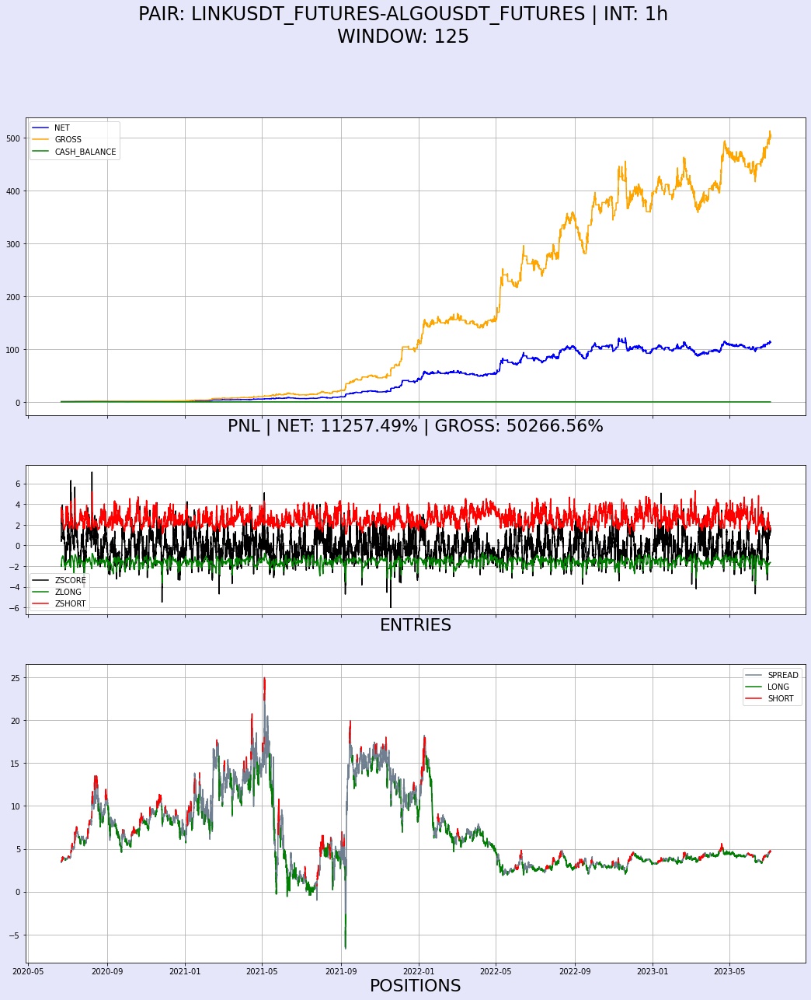

In [22]:
backtester.backtest_pair(
  z_long_perc=2,
  z_short_perc=99,
  tp=0.02,
  sl=-0.04,
  charts=True,
  silent=False,
  window=125,
  # start_date="2021-03-01 00:00:00",
  initial_balance=1000,
  # use_raw_spread=True,
  # use_pykalman=True
  # stationarity_testing=True,
)

In [ ]:
backtester.result.net_cum.plot(figsize=(24,16))
(backtester.result.curr_balance/1000).plot()
(backtester.result.signals/2+1).plot()

In [23]:
backtester.result

,LINKUSDT_FUTURES_position,ALGOUSDT_FUTURES_position,signals,spread,hedge_ratio,zscore,z_long,z_short,gross_returns,net_returns,gross_cum,net_cum,curr_balance
Date,,,,,,,,,,,,,
2020-06-21 16:00:00,0.0,0.0,0.0,3.405444,-3.288757,0.586356,-1.877561,3.311681,0.000000,0.000000,1.000000,1.000000,1000.000000
2020-06-21 17:00:00,0.0,0.0,0.0,3.402290,-3.289417,0.528846,-1.917943,3.696464,0.000000,0.000000,1.000000,1.000000,1000.000000
2020-06-21 18:00:00,0.0,0.0,0.0,3.395030,-3.290250,0.383648,-1.913399,3.387852,0.000000,0.000000,1.000000,1.000000,1000.000000
2020-06-21 19:00:00,0.0,0.0,0.0,3.410896,-3.291042,0.669677,-1.955228,2.782538,0.000000,0.000000,1.000000,1.000000,1000.000000
2020-06-21 20:00:00,0.0,0.0,0.0,3.412062,-3.291794,0.702775,-2.029678,3.546501,0.000000,0.000000,1.000000,1.000000,1000.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-03 17:00:00,1.0,-1.0,-1.0,5.922035,-5.454266,1.463983,-1.644986,1.588976,0.004917,0.004917,505.423960,113.971437,671.773506
2023-07-03 18:00:00,1.0,-1.0,-1.0,5.956152,-5.458354,1.596816,-1.641750,1.573604,-0.000426,-0.000426,505.208778,113.922914,671.773506
2023-07-03 19:00:00,1.0,-1.0,-1.0,5.964238,-5.462691,1.606347,-1.635534,1.562327,0.003409,0.003409,506.931091,114.311290,671.773506


<h2>OPTIMIZATION</h2>

0 / 9
1 / 9
2 / 9
3 / 9
4 / 9
5 / 9
6 / 9
7 / 9
8 / 9


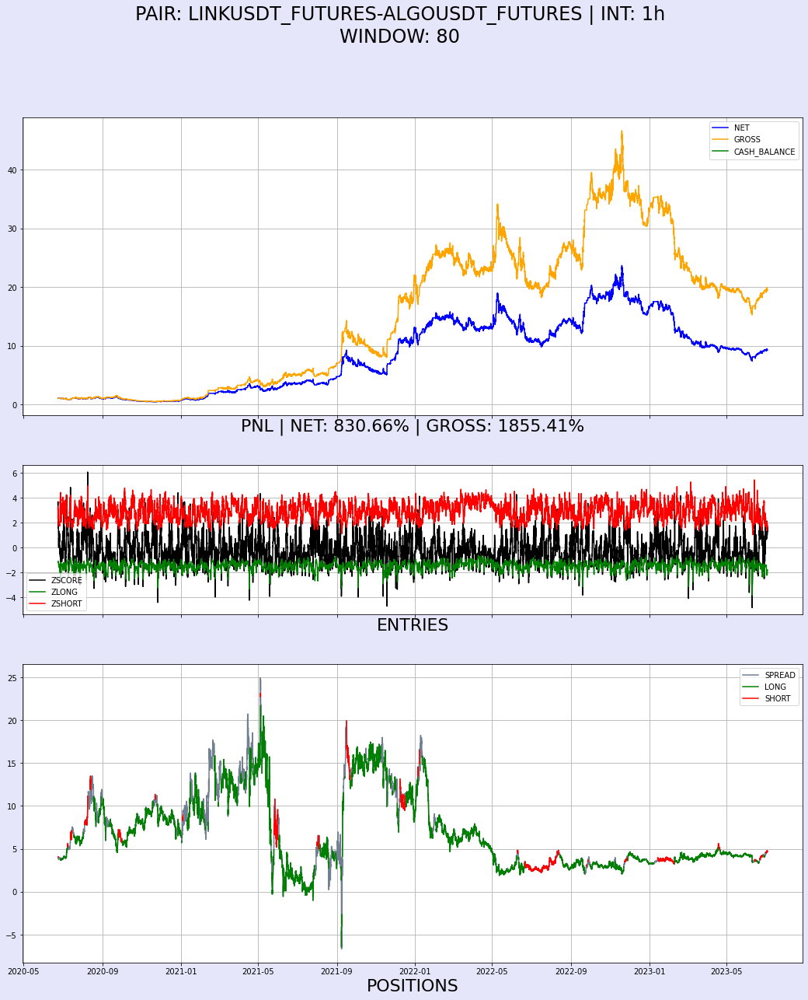

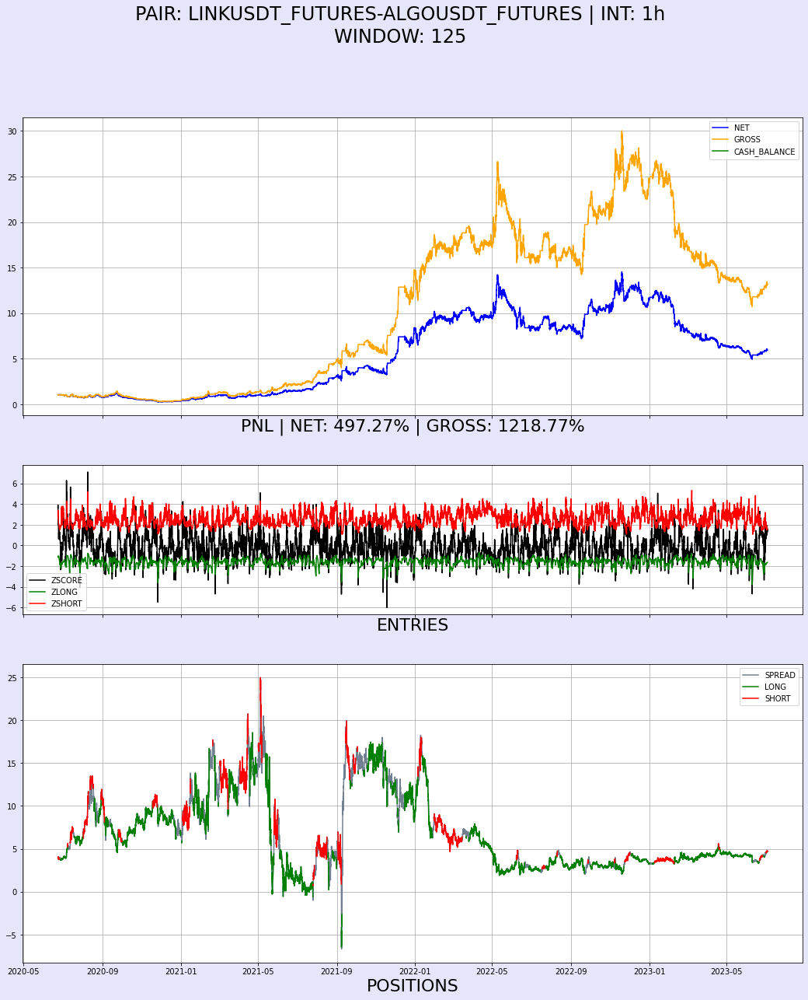

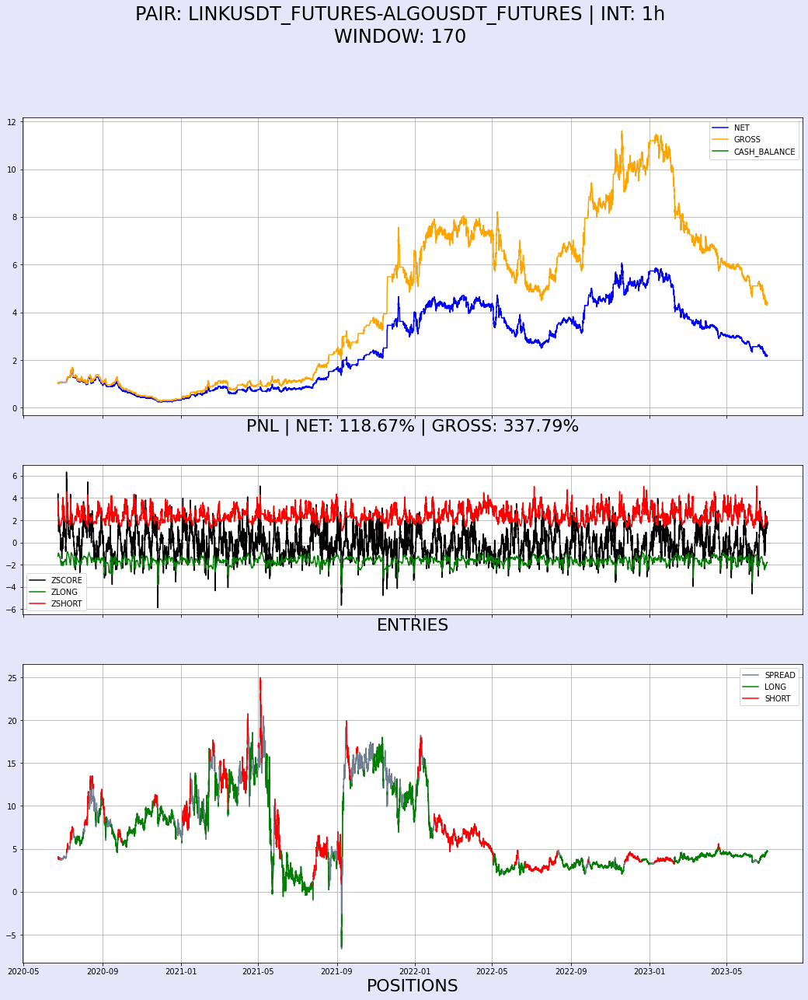

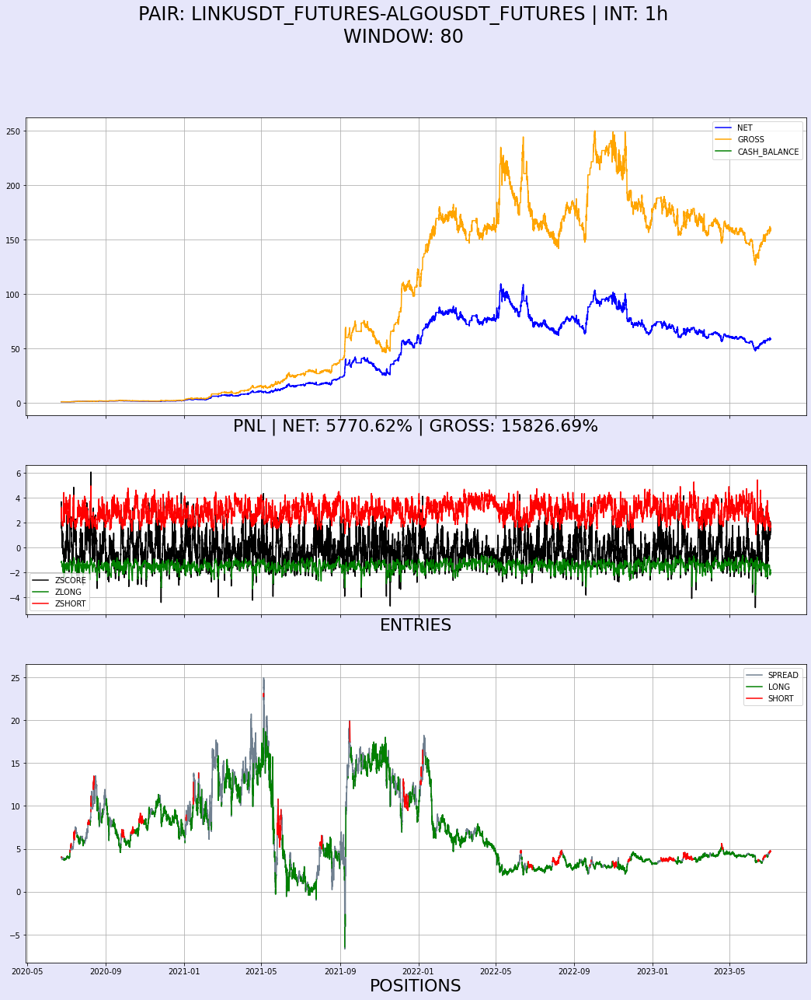

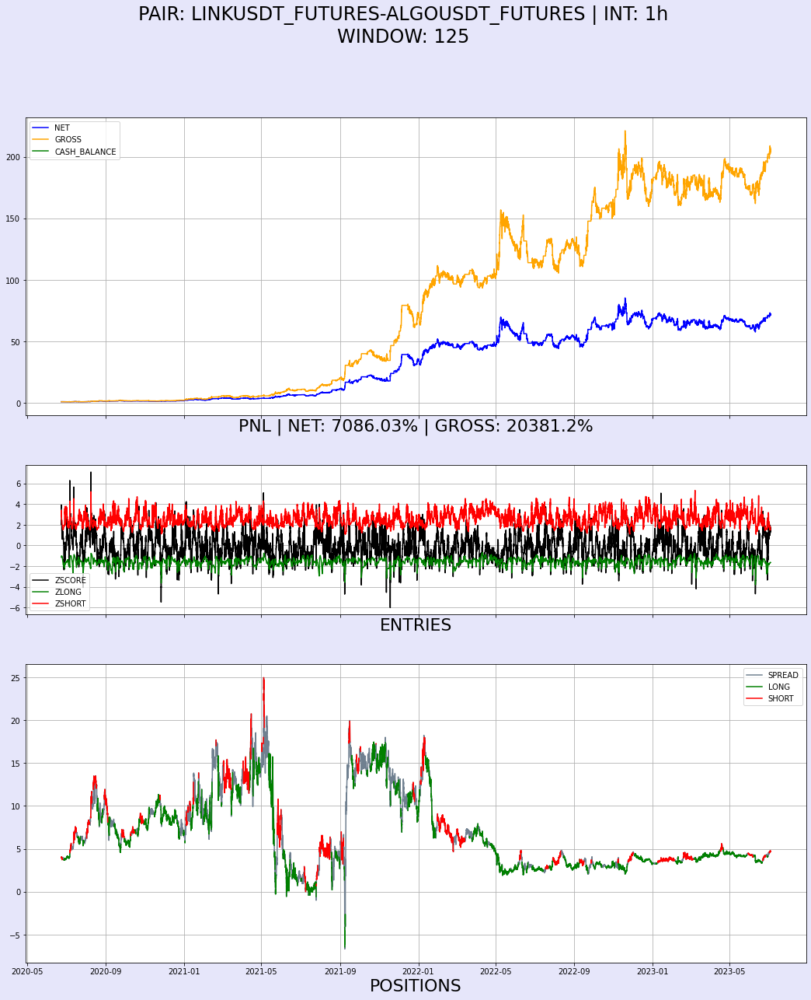

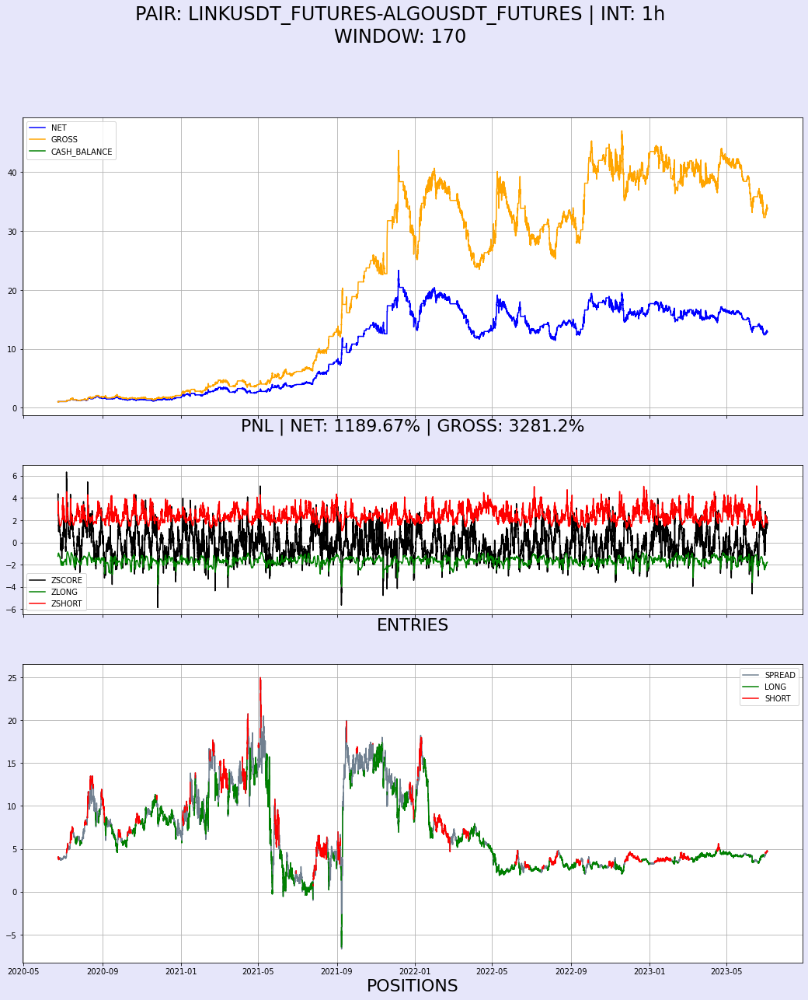

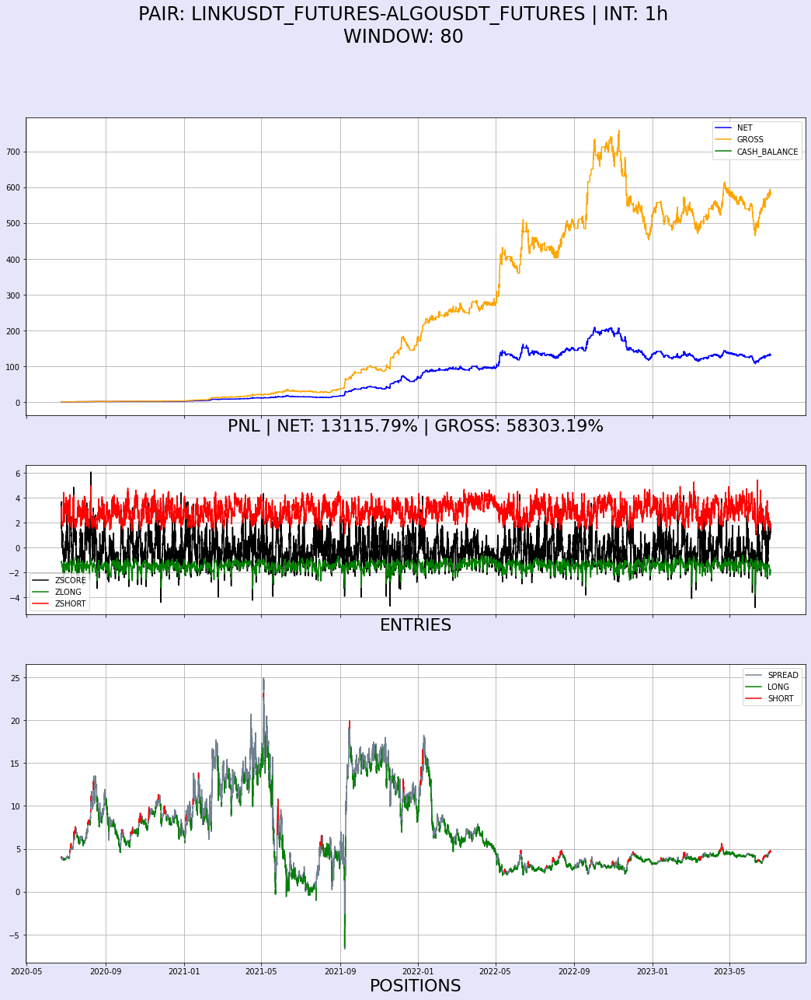

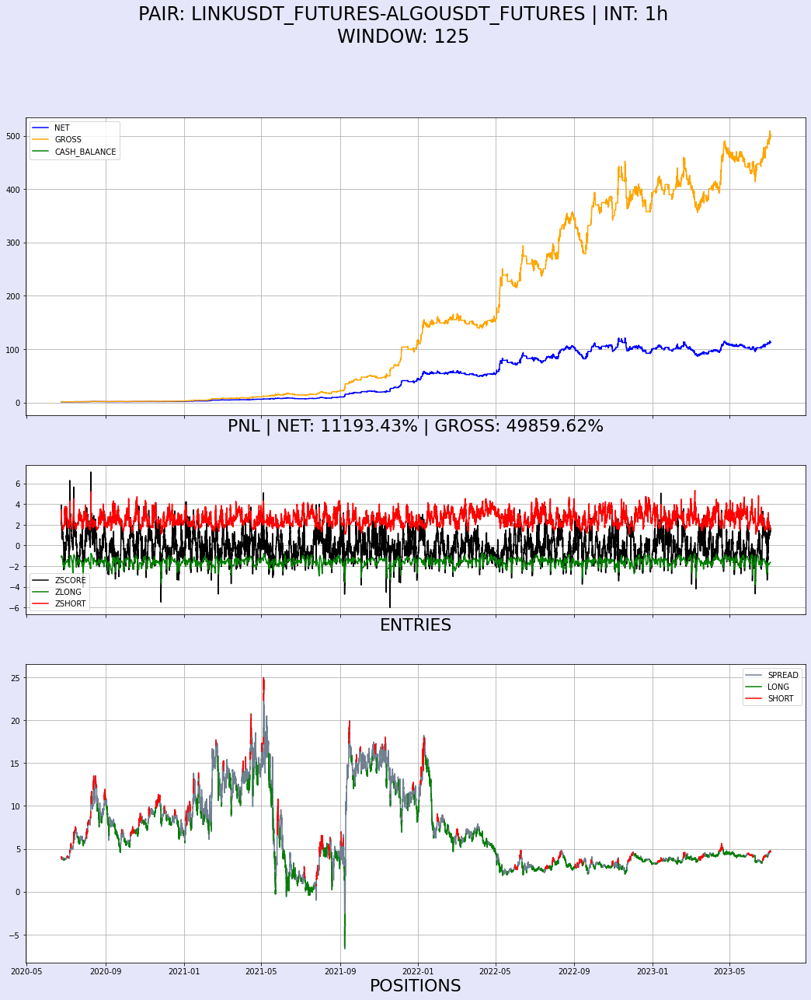

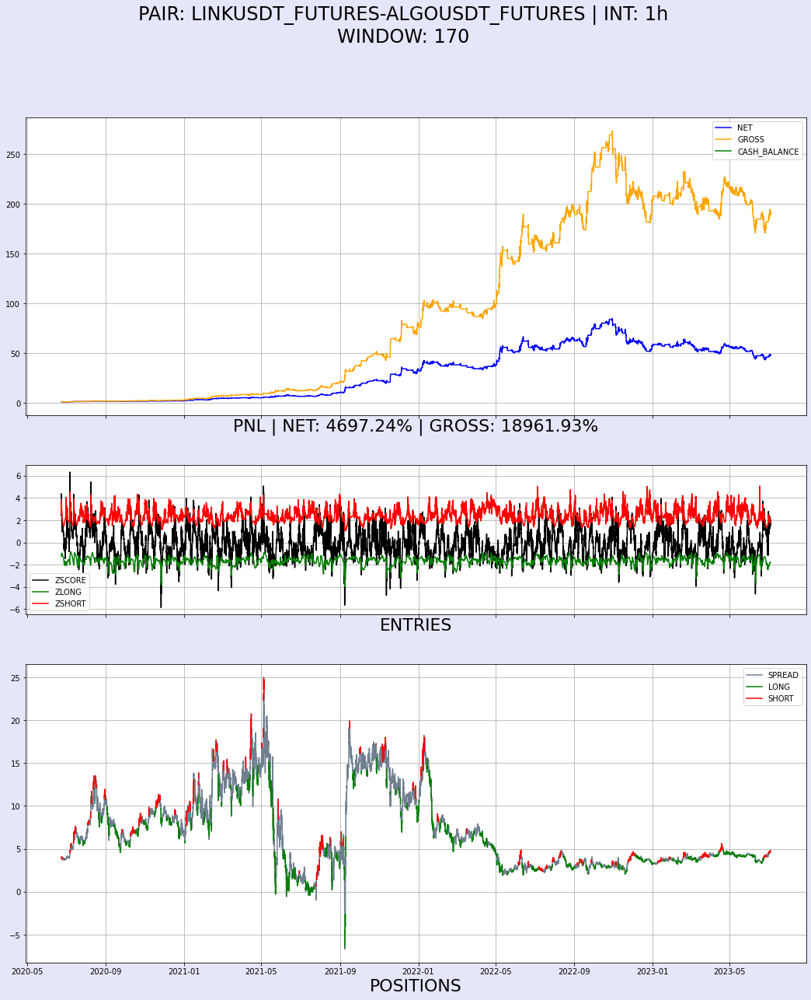

In [20]:
backtester.optimize_pair(
  windows_range=(80, 200, 45),
  short_entries_range=(99,100,1),
  long_entries_range=(2, 3, 1),
  sl_range=(-0.20, -0.03, 0.08),
  tp_range=(0.02, 0.03, 0.01),
  # initial_balance=1000,
  report=True,
  charts=True,
  cache_process=True,
  # cache_path="../processed_data/BACKTESTER_TEST/ENJUSDT_FUTURES_ZENUSDT_FUTURES_30m/ENJUSDT_FUTURES_ZENUSDT_FUTURES_optimization_overview_cache.csv"
)

In [21]:
backtester.opt_overview

,le,se,sl,tp,window,net,max_dd
2_99_-0.2_0.02_170,2.0,99.0,-0.20,0.02,170.0,2.187,-0.555
2_99_-0.2_0.02_125,2.0,99.0,-0.20,0.02,125.0,5.973,-0.618
2_99_-0.2_0.02_80,2.0,99.0,-0.20,0.02,80.0,9.307,-0.660
2_99_-0.12_0.02_170,2.0,99.0,-0.12,0.02,170.0,12.897,-0.490
2_99_-0.04_0.02_170,2.0,99.0,-0.04,0.02,170.0,47.972,-0.485
2_99_-0.12_0.02_80,2.0,99.0,-0.12,0.02,80.0,58.706,-0.559
2_99_-0.12_0.02_125,2.0,99.0,-0.12,0.02,125.0,71.860,-0.361
2_99_-0.04_0.02_125,2.0,99.0,-0.04,0.02,125.0,112.934,-0.285
2_99_-0.04_0.02_80,2.0,99.0,-0.04,0.02,80.0,132.158,-0.484


In [45]:

backtester.result

,AVAXUSDT_FUTURES_position,DOTBUSD_FUTURES_position,signals,spread,hedge_ratio,zscore,z_long,z_short,gross_returns,net_returns,gross_cum,net_cum,curr_balance
Date,,,,,,,,,,,,,
2022-06-11 12:00:00,0.0,0.0,0.0,1.916673,-2.321618,-1.387187,-1.927581,1.839692,0.000000,0.000000,1.000000,1.000000,1.000000e+03
2022-06-11 13:00:00,0.0,0.0,0.0,2.046400,-2.319013,-0.860300,-1.932122,1.950248,0.000000,0.000000,1.000000,1.000000,1.000000e+03
2022-06-11 14:00:00,0.0,0.0,0.0,1.772702,-2.314721,-1.898925,-1.918151,1.982794,0.000000,0.000000,1.000000,1.000000,1.000000e+03
2022-06-11 15:00:00,-1.0,1.0,1.0,1.494598,-2.308557,-2.832696,-1.827111,1.955756,0.015915,0.014715,1.015915,1.014715,7.000500e+03
2022-06-11 16:00:00,-1.0,1.0,1.0,1.541614,-2.302587,-2.533800,-2.042892,1.975607,0.001216,0.001216,1.017150,1.015949,7.000500e+03
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-03 17:00:00,0.0,0.0,0.0,2.153186,-2.076888,0.292112,-2.565030,2.485202,0.000000,0.000000,5.843991,4.863949,1.845124e+07
2023-07-03 18:00:00,0.0,0.0,0.0,2.298865,-2.078641,1.263063,-2.408133,2.445629,0.000000,0.000000,5.843991,4.863949,1.845124e+07
2023-07-03 19:00:00,0.0,0.0,0.0,2.254327,-2.080059,0.944765,-2.254495,2.498599,0.000000,0.000000,5.843991,4.863949,1.845124e+07


In [ ]:
backtester.data.iloc[10].loc['COTIUSDT_FUTURES']

0.42623

In [ ]:
backtester.data.loc["2021-03-10 10:00:00", "COTIUSDT_FUTURES"]

0.45803

In [ ]:
df = backtester.result.copy()
pair=backtester.pair
inst1 = pair[0]
inst2 = pair[1]

In [ ]:
df['dailyret'] = (backtester.data['%s_logs' % inst1]* -df['signals'].shift(1)) + (backtester.data['%s_logs' % inst2]*df['signals'].shift(1))
df['gross'] = df['dailyret'].cumsum().apply(np.exp)

df['trades'] = df.signals.diff().fillna(0).abs()*2
dailyret_net = df['dailyret'] - df['trades']*backtester.tc
df['net'] = dailyret_net.cumsum().apply(np.exp)

In [ ]:
df

,1INCHUSDT_FUTURES_position,COTIUSDT_FUTURES_position,signals,spread,hedge_ratio,zscore,z_long,z_short,gross_returns,net_returns,gross_cum,net_cum,dailyret,gross,trades,net
Date,,,,,,,,,,,,,,,,
2021-10-01 01:00:00,0.0,0.0,0.0,1.495113,-1.868421,-1.121303,-1.810425,1.830513,0.0,0.0,1.000000,1.000000,NaN,NaN,0.0,NaN
2021-10-01 02:00:00,0.0,0.0,0.0,1.456756,-1.867907,-1.196210,-1.806710,1.840315,0.0,0.0,1.000000,1.000000,0.0,1.00000,0.0,1.000000
2021-10-01 03:00:00,0.0,0.0,0.0,1.468483,-1.867363,-1.168798,-1.803183,1.842480,0.0,0.0,1.000000,1.000000,0.0,1.00000,0.0,1.000000
2021-10-01 04:00:00,0.0,0.0,0.0,1.468495,-1.866853,-1.165363,-1.799665,1.844599,0.0,0.0,1.000000,1.000000,0.0,1.00000,0.0,1.000000
2021-10-01 05:00:00,0.0,0.0,0.0,1.502803,-1.866526,-1.092014,-1.796503,1.838938,0.0,0.0,1.000000,1.000000,-0.0,1.00000,0.0,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-11-19 10:00:00,0.0,0.0,0.0,0.490875,-0.527193,-0.972367,-1.765557,1.895800,0.0,0.0,0.935355,0.887333,0.0,1.03786,0.0,0.984482
2022-11-19 11:00:00,0.0,0.0,0.0,0.493534,-0.527321,-0.902464,-1.764358,1.895620,0.0,0.0,0.935355,0.887333,0.0,1.03786,0.0,0.984482
2022-11-19 12:00:00,0.0,0.0,0.0,0.493072,-0.527457,-0.913237,-1.763154,1.895385,0.0,0.0,0.935355,0.887333,0.0,1.03786,0.0,0.984482
